In [29]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.graph_objects as go 
import sys
# Adjust the path below to the path of your `module_directory`
sys.path.append('../thesis-2p-behavior-align/')
# Now you can import your module or function
import imaging_behavior_functions
import odor_behavioral_analysis
import scipy.cluster.hierarchy as sch
import glob
from scipy.stats import zscore
from scipy.stats import sem
import mat73
from rastermap import Rastermap, utils

In [2]:
base_path = "//research.files.med.harvard.edu/neurobio/wilsonlab/Jingxuan/stacks/"
example_path_data = base_path+"20240314-4_MB042B_TOM20GCAMP7f_odor/data/"
example_path_results = base_path+"20240314-4_MB042B_TOM20GCAMP7f_odor/results/"
trial_num = 1
odor_threshold = 5
time_interval_threshold = 16  # Assuming time is in seconds or an equivalent unit
k = 8
window_size = 30

is_mat73, roi_df, dff_raw, kinematics_raw, preprocessed_vars_ds, preprocessed_vars_odor = imaging_behavior_functions.load_intermediate_mat(example_path_data,trial_num)
behav_df = imaging_behavior_functions.make_df_behavior(dff_raw, preprocessed_vars_ds, preprocessed_vars_odor,trial_num,ball_d = 9)
xPos, yPos = imaging_behavior_functions.reconstruct_path(behav_df, ball_d = 9)
roi_names, hdeltab_index, epg_index, hdeltab_sequence, epg_sequence = imaging_behavior_functions.get_roi_seq(roi_df)
dff_all_rois, dff_time = imaging_behavior_functions.load_dff_raw(is_mat73, dff_raw)
neural_df = imaging_behavior_functions.make_df_neural(dff_all_rois, dff_time, roi_names, hdeltab_index, epg_index, hdeltab_sequence, epg_sequence)
behav_df, padded_result_df, smoothed_df = odor_behavioral_analysis.analysis_dfs(behav_df, time_interval_threshold, k, window_size)
combined_df = imaging_behavior_functions.combine_df(behav_df, neural_df)
smoothed_df["translationalV_smoothed"] = np.sqrt(smoothed_df["fwV_smoothed"]**2+smoothed_df["sideV_smoothed"]**2)

In [3]:
selected_df = neural_df.drop(columns=['time'])
selected_df

,PAM_DAN
0,0.008469
1,0.035717
2,0.066625
3,0.081791
4,0.064137
...,...
4437,0.113307
4438,0.083507
4439,0.063875
4440,0.055346


In [4]:
base_dir = '//research.files.med.harvard.edu/neurobio/wilsonlab/Jingxuan/stacks/20240314-4_MB042B_TOM20GCAMP7f_odor/E_05_Iter_10152/plane_5/suite2p/plane0'
F = np.load(base_dir+'/F.npy', allow_pickle=True)
Fneu = np.load(base_dir+'/Fneu.npy', allow_pickle=True)
spks = np.load(base_dir+'/spks.npy', allow_pickle=True)
stat = np.load(base_dir+'/stat.npy', allow_pickle=True)
ops =  np.load(base_dir+'/ops.npy', allow_pickle=True)
ops = ops.item()
iscell = np.load(base_dir+'/iscell.npy', allow_pickle=True)

In [5]:
F_cell = F[(iscell[:,0]==1),:]
spks_cell = spks[(iscell[:,0]==1),:]
Fneu_cell = Fneu[(iscell[:,0]==1),:]
stat_cell = stat[(iscell[:,0]==1)]

In [8]:
n_components=100
def perform_pca(selected_df, n_components):
    """
    Perform PCA on the given dataframe.

    Args:
    - data (pd.DataFrame): The dataframe containing neuron activity data.
    - n_components (int): The number of principal components to compute.

    Returns:
    - pca (PCA object): The PCA object after fitting the data.
    - transformed_data (np.array): Data transformed into principal components.
    - explained_variance_ratio (np.array): The amount of variance explained by each of the selected components.
    """
    # Standardize the data (important for PCA)
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(selected_df)

    # Perform PCA
    pca = PCA(n_components=n_components)
    transformed_data = pca.fit_transform(scaled_data)
    explained_variance_ratio = pca.explained_variance_ratio_

    return pca, transformed_data, explained_variance_ratio
pca, transformed_data, explained_variance_ratio = perform_pca(F_cell.T,n_components)

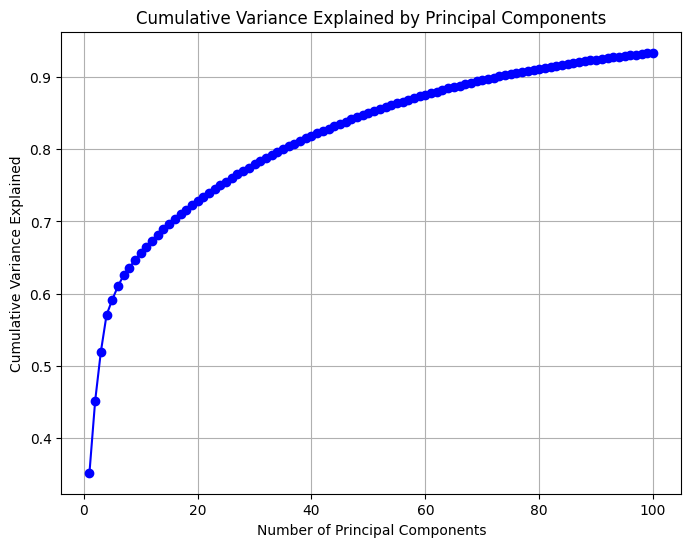

In [9]:
# Calculate cumulative variance explained
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Plot cumulative variance explained
plt.figure(figsize=(8, 6))
plt.plot(np.arange(1, n_components + 1), cumulative_variance, marker='o', linestyle='-', color='b')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Variance Explained')
plt.title('Cumulative Variance Explained by Principal Components')
plt.grid(True)
plt.show()

In [10]:
behav_df

,time,fwV,sideV,yawV,heading,abssideV,absyawV,net_motion,net_motion_state,heading_adj,odor,xPos,yPos,cluster_label_temporal,soft_cluster_label_temporal,cluster_label_spatial
0,0.000000,0.000000,0.000000,0.000000,2.148951,0.000000,0.000000,0.000000,0,2.148951,-0.000000,0.000000,0.000000,0,0,0
1,0.137348,0.019787,0.686757,-0.026695,2.147896,0.686757,0.026695,0.733239,1,2.147896,-0.012632,0.005230,0.007962,0,0,0
2,0.274696,0.003104,0.474309,-0.028298,2.147884,0.474309,0.028298,0.505710,0,2.147884,-0.011552,0.008844,0.012010,0,0,0
3,0.412044,-0.015032,-0.016197,-0.003664,2.148285,0.016197,0.003664,0.034893,0,2.148285,-0.013277,0.008722,0.009821,0,0,0
4,0.549392,0.016581,0.444654,-0.024737,2.148040,0.444654,0.024737,0.485971,0,2.148040,-0.013408,0.012108,0.015494,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4437,609.412728,-2.190722,-17.395007,10.009493,5.676036,17.395007,10.009493,29.595222,1,-0.607149,-0.156175,-1147.651921,119.377768,0,8,0
4438,609.550076,1.294853,-2.766706,3.003064,5.888459,2.766706,3.003064,7.064622,1,-0.394727,-0.152910,-1147.722712,119.236340,0,8,0
4439,609.687424,1.082359,-7.191814,3.458461,6.048390,7.191814,3.458461,11.732634,1,-0.234795,-0.157971,-1147.747344,119.130503,0,8,0
4440,609.824772,3.480461,20.894195,-10.204625,5.759182,20.894195,10.204625,34.579281,1,-0.524003,-0.158038,-1148.177437,118.633802,0,8,0


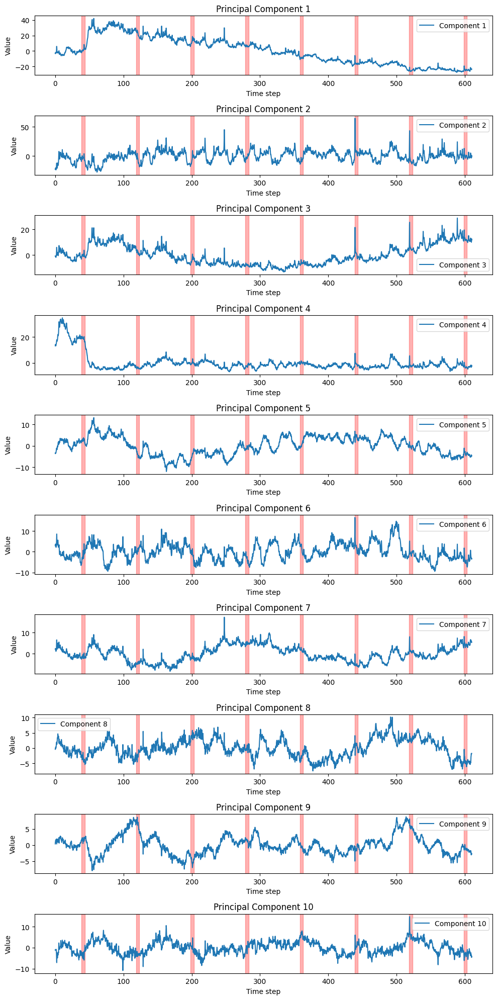

In [11]:
# visualze top PCstime_steps = range(transformed_data.shape[0])

n_components = 10
time_steps = range(transformed_data.shape[0])
# Check if 'odor' column exists and shade where odor > 5
if 'odor' in behav_df.columns:
    odor_mask = behav_df['odor'] > 5

# Create a figure with subplots
fig, axes = plt.subplots(n_components, 1, figsize=(10, 2*n_components))

for i in range(n_components):
    ax = axes[i]
    ax.plot(neural_df.time, transformed_data[:, i], label=f'Component {i+1}')
    ax.set_title(f'Principal Component {i+1}')
    ax.set_xlabel('Time step')
    ax.set_ylabel('Value')
    ax.legend()
    # Apply shading to all subplots
    ax.fill_between(behav_df['time'], ax.get_ylim()[0], ax.get_ylim()[1], where=odor_mask, color='red', alpha=0.3, transform=ax.get_xaxis_transform())
    

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

In [12]:
# Extract the first three PCs
pc1 = transformed_data[:, 0]
pc2 = transformed_data[:, 1]
pc3 = transformed_data[:, 2]

# Time steps for coloring
#phase = np.array(param_df.phase)
#heading = 2*np.pi - np.array(behav_df.heading)
x_pos = np.array([stat[i]['med'][0] for i in range(len(stat))])
x_pos_cell = x_pos[(iscell[:,0]==1)]
y_pos = np.array([stat[i]['med'][1] for i in range(len(stat))])
y_pos_cell = y_pos[(iscell[:,0]==1)]
heading = 2*np.pi-behav_df.heading
odor = behav_df.odor

# Create the figure
fig = go.Figure(data=[go.Scatter3d(
    x=pc1,
    y=pc2,
    z=pc3,
    mode='markers',
    marker=dict(
        size=5,
        color=odor, 
        colorscale='Viridis',  # Choose a color scale
        colorbar=dict(title='y position'),
        opacity=0.8
    )
)])

# Set the layout of the figure
fig.update_layout(
    title='Trajectory of the First 3 Principal Components in State Space',
    scene=dict(
        xaxis_title='PC1',
        yaxis_title='PC2',
        zaxis_title='PC3'
    ),
    margin=dict(l=0, r=0, b=0, t=30)
)

# Show the figure
fig.show()


<Axes: >

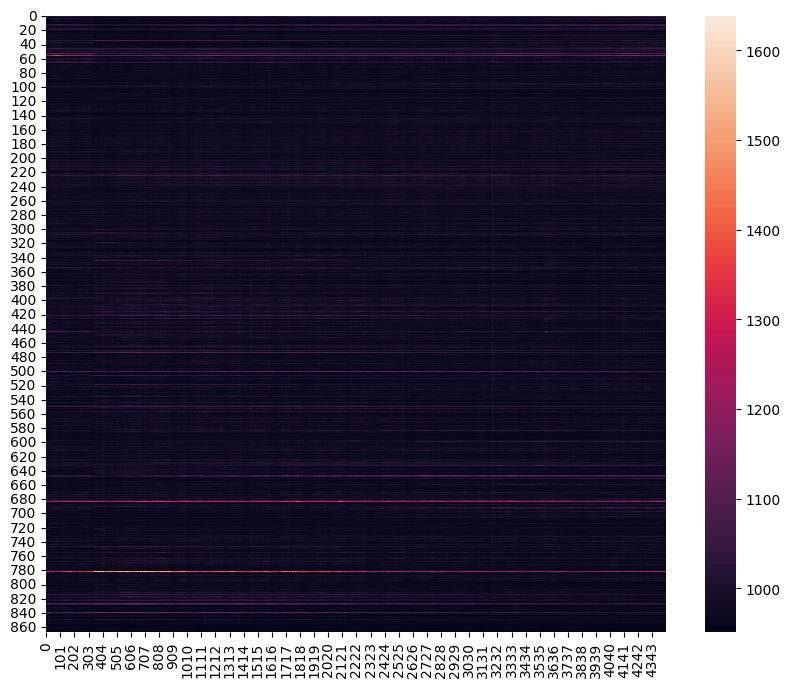

In [14]:
fig, ax = plt.subplots(figsize=(10,8))
sort_id_x = np.argsort(x_pos_cell)
sort_id_y = np.argsort(y_pos_cell)
sns.heatmap(F_cell[sort_id_y])

In [15]:
def dfoverf(F):
    # Determine F_0 using the 5th percentile of the fluorescence data
    F_0 = np.percentile(F, 5, axis=1)

    # Calculate ΔF/F
    deltaF_over_F = (F - F_0[:, np.newaxis]) / F_0[:, np.newaxis]
    return deltaF_over_F
dF_cell = dfoverf(F_cell)

<Axes: >

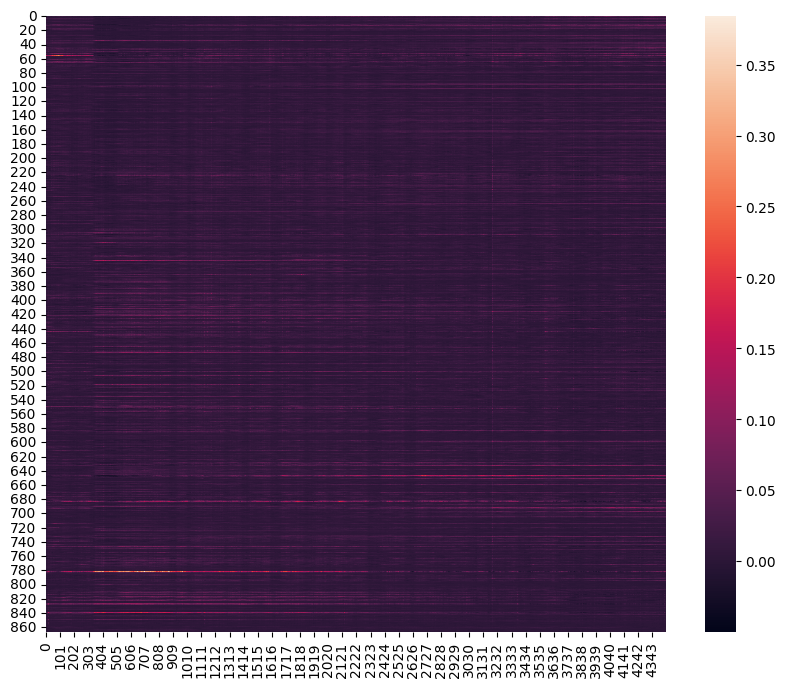

In [16]:
fig, ax = plt.subplots(figsize=(10,8))
sort_id_x = np.argsort(x_pos_cell)
sort_id_y = np.argsort(y_pos_cell)
sns.heatmap(dF_cell[sort_id_y])

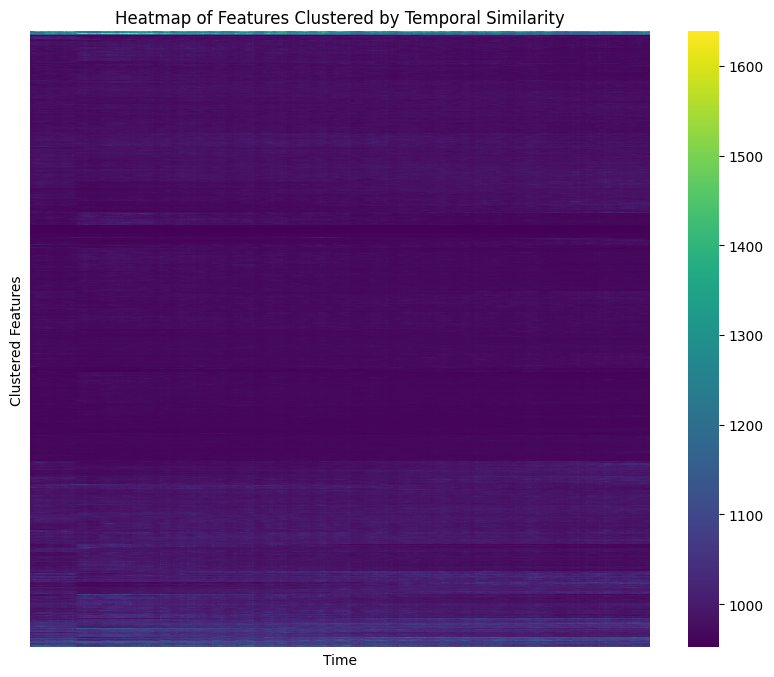

In [17]:
def hierachical_cluster(matrix, method='average', metric='euclidean'):
    """
    Clusters a matrix on the feature dimension based on temporal similarity and plots a heatmap.
    
    Parameters:
    - matrix: A 2D NumPy array with shape (features, time).
    - method: Method of clustering ('average', 'single', 'complete', etc.).
    - metric: Distance metric for clustering ('euclidean', 'cosine', etc.).
    """
    
    # Perform hierarchical clustering on the features
    Y = sch.linkage(matrix, method=method, metric=metric)
    Z = sch.dendrogram(Y, orientation='right', no_plot=True)  # 'no_plot=True' to not plot the dendrogram
    
    # Reorder the matrix according to the clustering
    index = Z['leaves']
    matrix_clustered = matrix[index, :]
    # Create a heatmap of the clustered matrix
    fig, ax = plt.subplots(figsize=(10,8))
    sns.heatmap(matrix_clustered, cmap='viridis', xticklabels=False, yticklabels=False)
    ax.set_title('Heatmap of Features Clustered by Temporal Similarity')
    ax.set_xlabel('Time')
    ax.set_ylabel('Clustered Features')
    plt.show()
    return Y, matrix_clustered

Y, F_cell_clus = hierachical_cluster(F_cell, method='average', metric='euclidean')

In [18]:
def cluster_dict_n(Y,last_x_step):
    # Initialize cluster labels for each original observation
    n = Y.shape[0] + 1  # Number of original observations
    cluster_labels = {i: [i] for i in range(n)}

    # Iterate over the linkage matrix
    for i, row in enumerate(Y[:n-1-last_x_step,:]):
        new_cluster_idx = n + i  # Index of the new cluster being formed
        cluster_i, cluster_j = int(row[0]), int(row[1])  # Clusters/observations being merged
        
        # Combine the labels from the clusters being merged into the new cluster
        cluster_labels[new_cluster_idx] = cluster_labels.pop(cluster_i) + cluster_labels.pop(cluster_j)
        
        # Optionally, print or store this information
        print(f"Step {i+1}: Merge clusters {cluster_i} and {cluster_j} into new cluster {new_cluster_idx}.")
    return cluster_labels
    # At this point, `cluster_labels` contains the labels for each step of the clustering

cluster_labels = cluster_dict_n(Y,4)


Step 1: Merge clusters 76 and 173 into new cluster 867.
Step 2: Merge clusters 55 and 867 into new cluster 868.
Step 3: Merge clusters 19 and 868 into new cluster 869.
Step 4: Merge clusters 121 and 251 into new cluster 870.
Step 5: Merge clusters 63 and 116 into new cluster 871.
Step 6: Merge clusters 56 and 869 into new cluster 872.
Step 7: Merge clusters 74 and 871 into new cluster 873.
Step 8: Merge clusters 193 and 870 into new cluster 874.
Step 9: Merge clusters 339 and 873 into new cluster 875.
Step 10: Merge clusters 28 and 872 into new cluster 876.
Step 11: Merge clusters 218 and 874 into new cluster 877.
Step 12: Merge clusters 114 and 730 into new cluster 878.
Step 13: Merge clusters 875 and 876 into new cluster 879.
Step 14: Merge clusters 567 and 877 into new cluster 880.
Step 15: Merge clusters 21 and 387 into new cluster 881.
Step 16: Merge clusters 38 and 878 into new cluster 882.
Step 17: Merge clusters 726 and 880 into new cluster 883.
Step 18: Merge clusters 281 and 

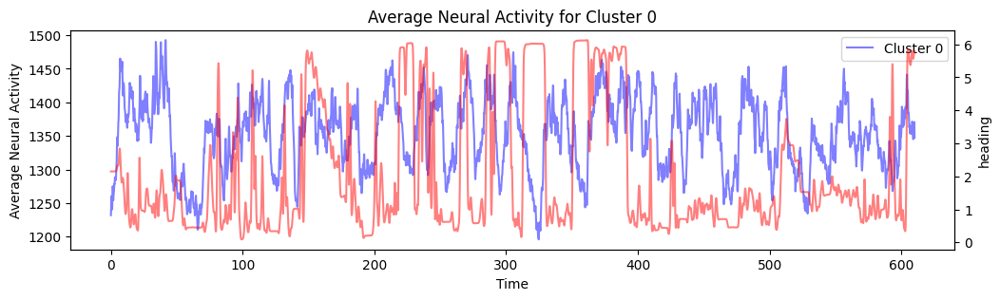

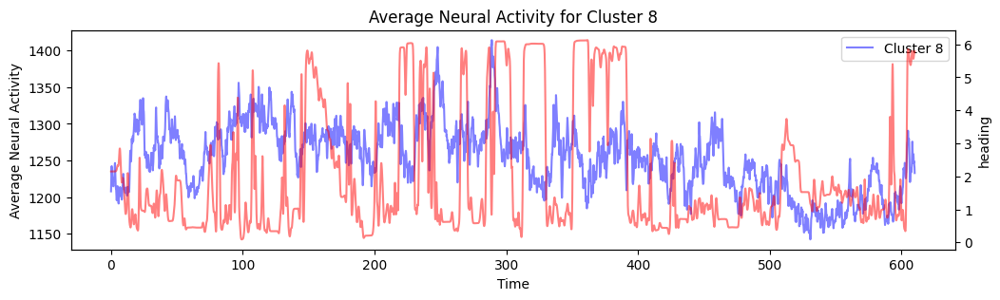

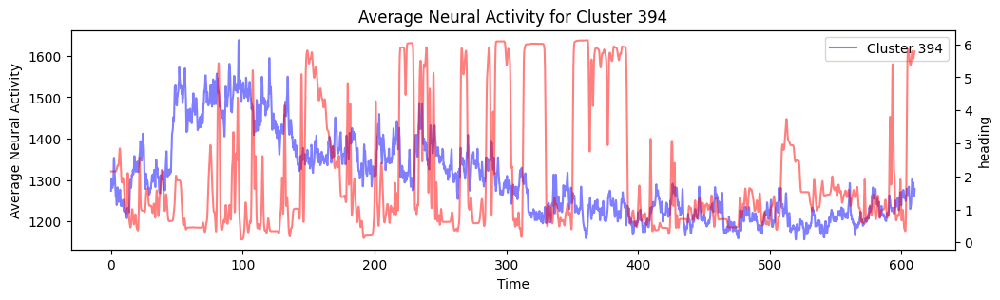

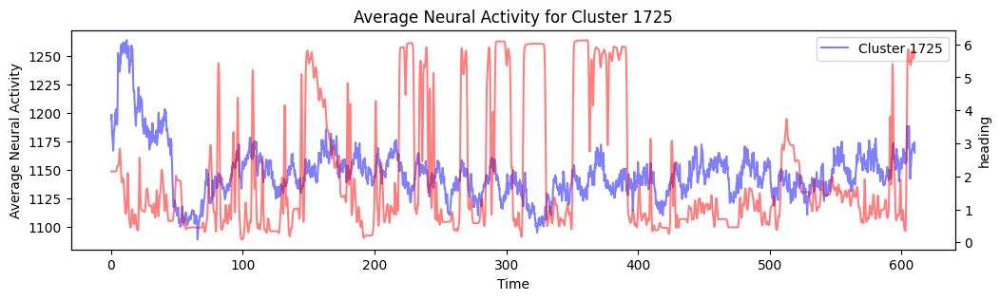

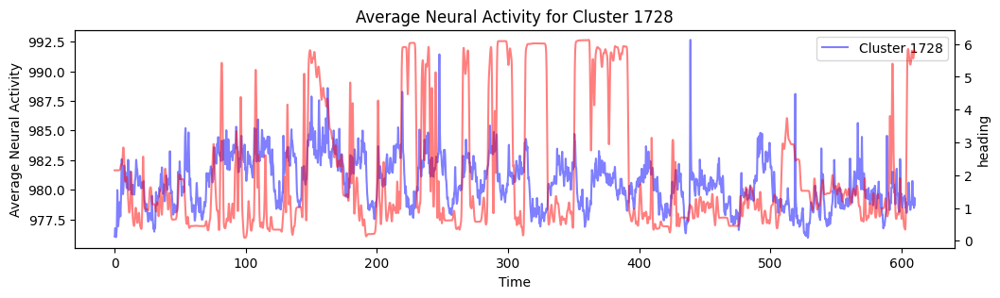

In [19]:
def plot_avg(F, cluster_labels, behav_df, ref_kw):
    for cluster_idx, roi_indices in cluster_labels.items():
        # Extract activities for the current cluster
        cluster_activities = F[roi_indices, :]
        
        # Compute the average activity over time for the cluster
        avg_activity = np.mean(cluster_activities, axis=0)
        
        # Plot the average activity
        fig, ax = plt.subplots(figsize=(12, 3))
        ax.plot(behav_df.time, avg_activity, label=f'Cluster {cluster_idx}',color = 'blue',alpha=0.5)
        ax2 = ax.twinx()
        ax2.plot(behav_df.time, imaging_behavior_functions.apply_gaussian_smoothing(behav_df[ref_kw],3),color = 'red', alpha=0.5)
        ax2.set_ylabel(ref_kw)
        ax.set_xlabel('Time')
        ax.set_ylabel('Average Neural Activity')
        ax.set_title(f'Average Neural Activity for Cluster {cluster_idx}')
        ax.legend()
        plt.show()

plot_avg(F_cell, cluster_labels, behav_df, 'heading')

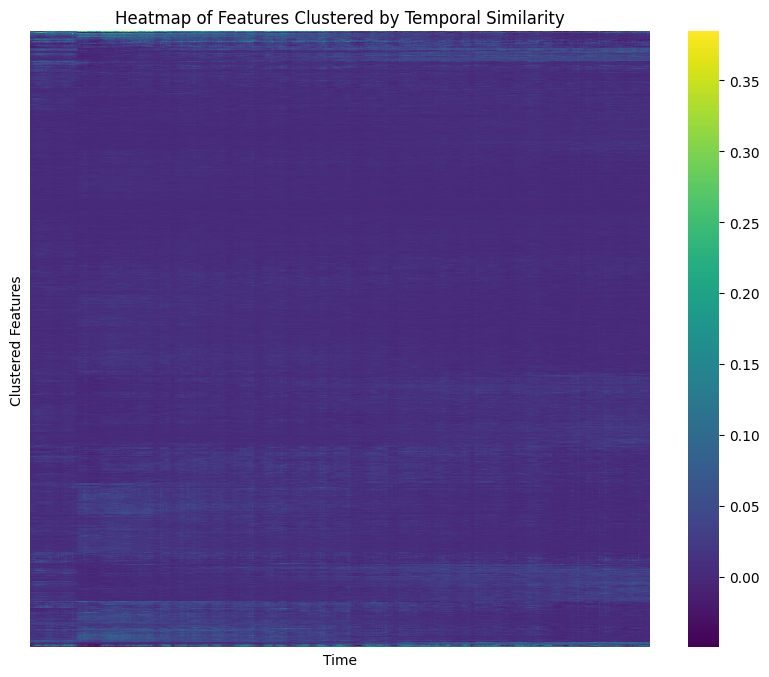

In [20]:
Y_dF, dF_cell_clus = hierachical_cluster(dF_cell, method='average', metric='euclidean')

Step 1: Merge clusters 76 and 173 into new cluster 867.
Step 2: Merge clusters 116 and 867 into new cluster 868.
Step 3: Merge clusters 55 and 56 into new cluster 869.
Step 4: Merge clusters 19 and 868 into new cluster 870.
Step 5: Merge clusters 869 and 870 into new cluster 871.
Step 6: Merge clusters 74 and 871 into new cluster 872.
Step 7: Merge clusters 121 and 251 into new cluster 873.
Step 8: Merge clusters 63 and 872 into new cluster 874.
Step 9: Merge clusters 873 and 874 into new cluster 875.
Step 10: Merge clusters 28 and 875 into new cluster 876.
Step 11: Merge clusters 218 and 876 into new cluster 877.
Step 12: Merge clusters 193 and 877 into new cluster 878.
Step 13: Merge clusters 339 and 878 into new cluster 879.
Step 14: Merge clusters 726 and 879 into new cluster 880.
Step 15: Merge clusters 114 and 730 into new cluster 881.
Step 16: Merge clusters 334 and 773 into new cluster 882.
Step 17: Merge clusters 119 and 825 into new cluster 883.
Step 18: Merge clusters 38 and

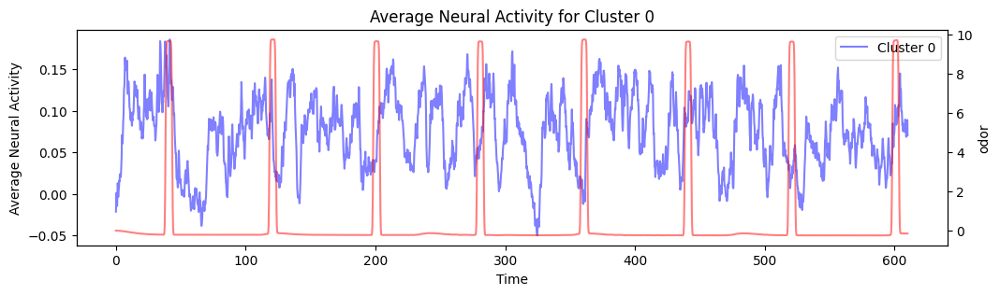

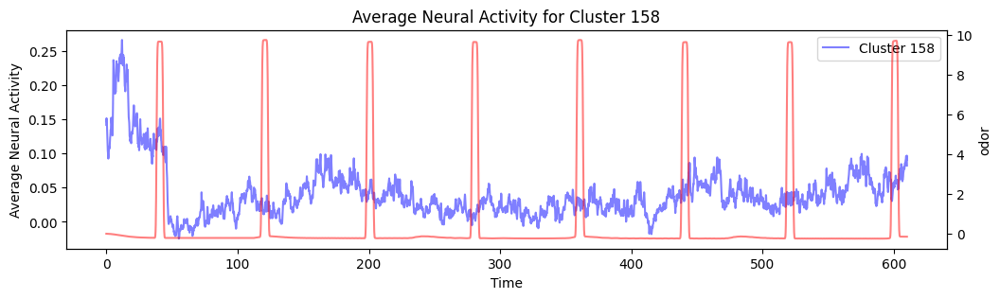

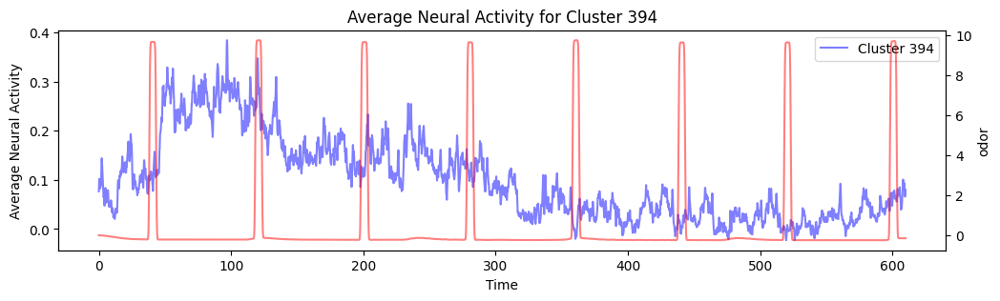

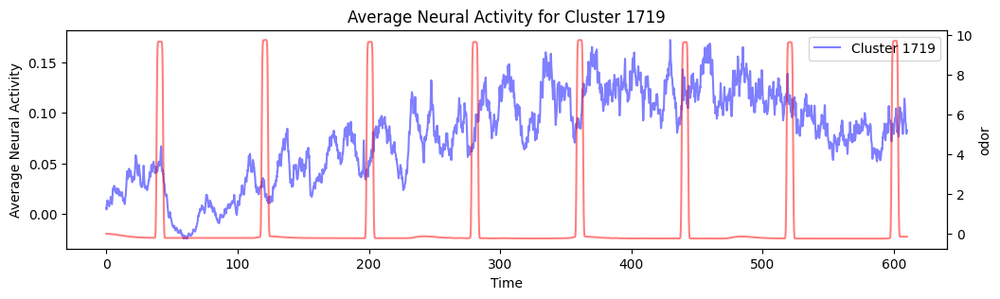

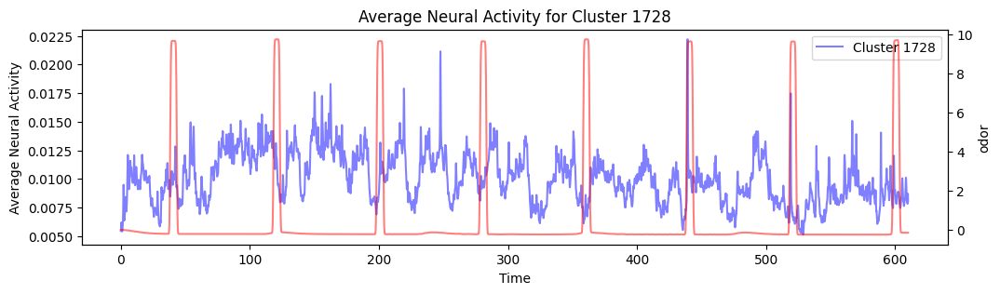

In [21]:
cluster_labels = cluster_dict_n(Y_dF,4)
plot_avg(dF_cell, cluster_labels, behav_df, 'odor')

## Rastermap

In [27]:
# load appropriate activity 
activity_mode = 3
if activity_mode == 0:
    fl_cell = F_cell
elif activity_mode == 1:
    fl_cell = Fneu_cell
elif activity_mode == 2:
    fl_cell = F_cell - 0.7 * Fneu_cell
else:
    fl_cell = dF_cell

In [30]:
fl_cell = zscore(fl_cell, axis=1)
fl_cell_norm = np.maximum(-4, np.minimum(8, fl_cell)) + 4
fl_cell_norm /= 12

In [31]:
model = Rastermap(n_clusters=35, # number of clusters to compute
                  n_PCs=128, # number of PCs to use
                  locality=0.75, # locality in sorting to find sequences (this is a value from 0-1)
                  time_lag_window=5, # use future timepoints to compute correlation
                  grid_upsample=10, # default value, 10 is good for large recordings
                  ).fit(fl_cell)
y = model.embedding # neurons x 1
isort = model.isort

normalizing data across axis=1
projecting out mean along axis=0
data normalized, 0.10sec
sorting activity: 867 valid samples by 4442 timepoints
n_PCs = 128 computed, 1.08sec
17 clusters computed, time 1.17sec
clusters sorted, time 1.19sec
clusters upsampled, time 1.22sec
rastermap complete, time 1.23sec


In [34]:
n_neurons, n_time = fl_cell.shape
nbin = 1 # number of neurons to bin over
ndiv = (n_neurons//nbin) * nbin
# group sorted matrix into rows of length nbin
sn = fl_cell[isort][:ndiv].reshape(ndiv//nbin, nbin, -1)
# take mean over neurons in a bin
sn = sn.mean(axis=1)

(-0.5, 0.5, 866.5, -0.5)

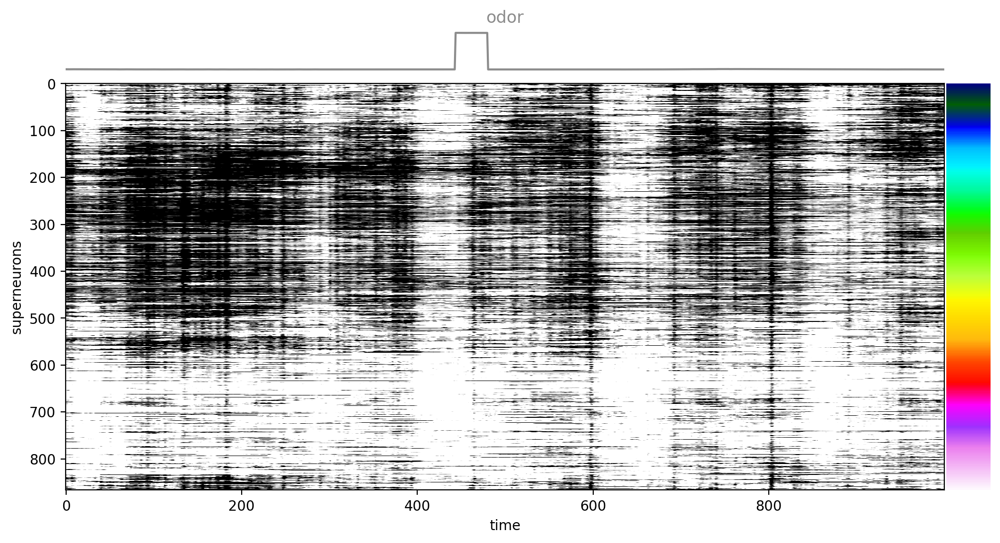

In [35]:
# timepoints to visualize
xmin = 1000
xmax = xmin + 1000

# make figure with grid for easy plotting
fig = plt.figure(figsize=(12,6), dpi=200)
grid = plt.GridSpec(9, 20, figure=fig, wspace = 0.05, hspace = 0.3)

# colors for the behaviors
kp_colors = np.array([[0.55,0.55,0.55], [0.,0.,1],
                      [0.8,0,0], [1.,0.4,0.2],
                      [0,0.6,0.4], [0.2,1,0.5],
                      ])

# plot behavior
ax = plt.subplot(grid[0, :-1])
ax.plot(np.array(behav_df.odor[xmin:xmax]), color=kp_colors[0])
ax.set_xlim([0, xmax-xmin])
ax.axis("off")
ax.set_title("odor", color=kp_colors[0])

# plot superneuron activity
ax = plt.subplot(grid[1:, :-1])
ax.imshow(sn[:, xmin:xmax], cmap="gray_r", vmin=0, vmax=0.8, aspect="auto")
ax.set_xlabel("time")
ax.set_ylabel("superneurons")

ax = plt.subplot(grid[1:, -1])
ax.imshow(np.arange(0, len(sn))[:,np.newaxis], cmap="gist_ncar", aspect="auto")
ax.axis("off")

In [36]:
model.embedding[:,0]

array([ 1.4,  7.9, 13.4, 12.7,  7.6,  7.7,  7.8,  3.2,  4. , 12.9,  7.9,
        7.8,  1.2, 13. , 12. , 12.8,  7. ,  2. , 13.2,  4.7,  1.3,  7.3,
       12.4,  7. , 13.2, 12.9,  7.7,  3.8, 12.3, 13.3,  7.8,  0.8,  7.8,
        7.4, 13.3,  5.3, 12.7,  9.1,  3.3,  7.4, 12.8,  3. ,  7.6,  9.7,
        6.3,  2.6,  7.7, 12.8, 12.8,  4.3, 12.9, 13.3,  6.9,  7.8,  9.2,
        8.3,  7.8,  7. , 12.5, 10.7,  7.6,  7. , 10.7,  6.7,  8.1, 13.3,
        8.8,  7. ,  7. , 13.1,  4.8, 10.8,  9.7,  8.2, 11.3, 12.9,  7.3,
       13. ,  5.2, 13.3,  8.8, 12.5,  9.8,  7. ,  4.3, 12.5,  4. ,  9.3,
       12.4,  2. ,  0.8, 12.8,  7.4,  6.2,  2.9,  3.6,  9.7, 12.8, 13.2,
        5.9, 14. , 12. , 13.2,  7.6, 12.8, 12.9,  7.6, 11.3, 11.9, 12.8,
       13.6,  7.1,  6. , 13. ,  7.2, 14.3,  1.7,  7. ,  9.7, 13.2,  7.5,
        9.8,  7.1,  5.6, 13.3, 14.8, 12.2, 12.8, 12.6,  8. , 12.5,  3.7,
       12.7, 12.2, 12.6, 11.2,  1.2,  7.3,  7.1, 12.8,  2. ,  7.8, 12.5,
        1. , 13.2,  4.2,  2.7,  7. ,  0.7, 12. , 12

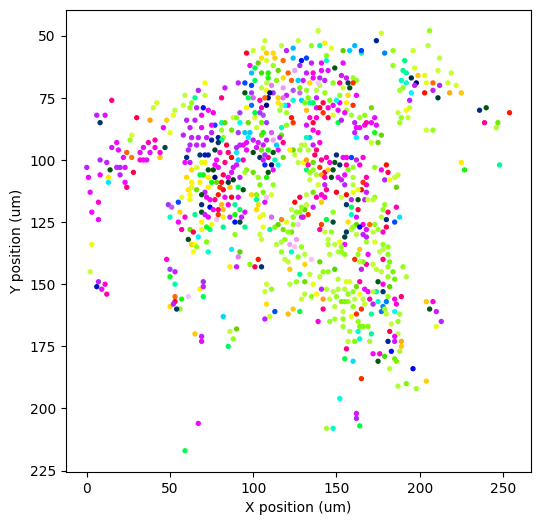

In [38]:
# POSITIONS OF ALL NEURONS
plt.figure(figsize=(6,6))
plt.scatter(y_pos_cell, x_pos_cell, s = 8, c=model.embedding[:,0], cmap="gist_ncar")
plt.xlabel('X position (um)')
plt.ylabel('Y position (um)')
plt.gca().invert_yaxis()
#plt.axis("square")

In [59]:
def map_to_bin(embedding, x_bins):
    # Define bin edges
    min_val = embedding.min()
    max_val = embedding.max()
    bins = np.linspace(min_val, max_val, x_bins + 1)  # +1 because we need edges for x bins

    # Map the embeddings to bin numbers
    bin_indices = np.digitize(embedding, bins, right=False) - 1  # Subtract 1 to make bin_indices start from 0

    # Create an array mapping embeddings to bin numbers
    mapped_embeddings = np.array([bin_indices[i] for i in range(len(embedding))])
    return mapped_embeddings

mapped_embeddings = map_to_bin(model.embedding[:,0], 4)

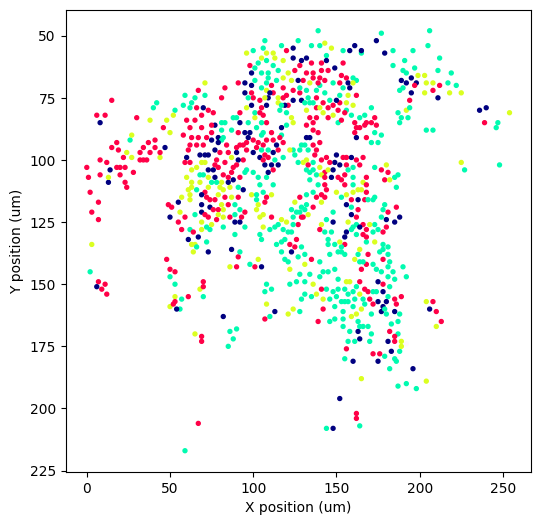

In [60]:
# POSITIONS OF ALL NEURONS
plt.figure(figsize=(6,6))
plt.scatter(y_pos_cell, x_pos_cell, s = 8, c=mapped_embeddings, cmap="gist_ncar")
plt.xlabel('X position (um)')
plt.ylabel('Y position (um)')
plt.gca().invert_yaxis()
#plt.axis("square")

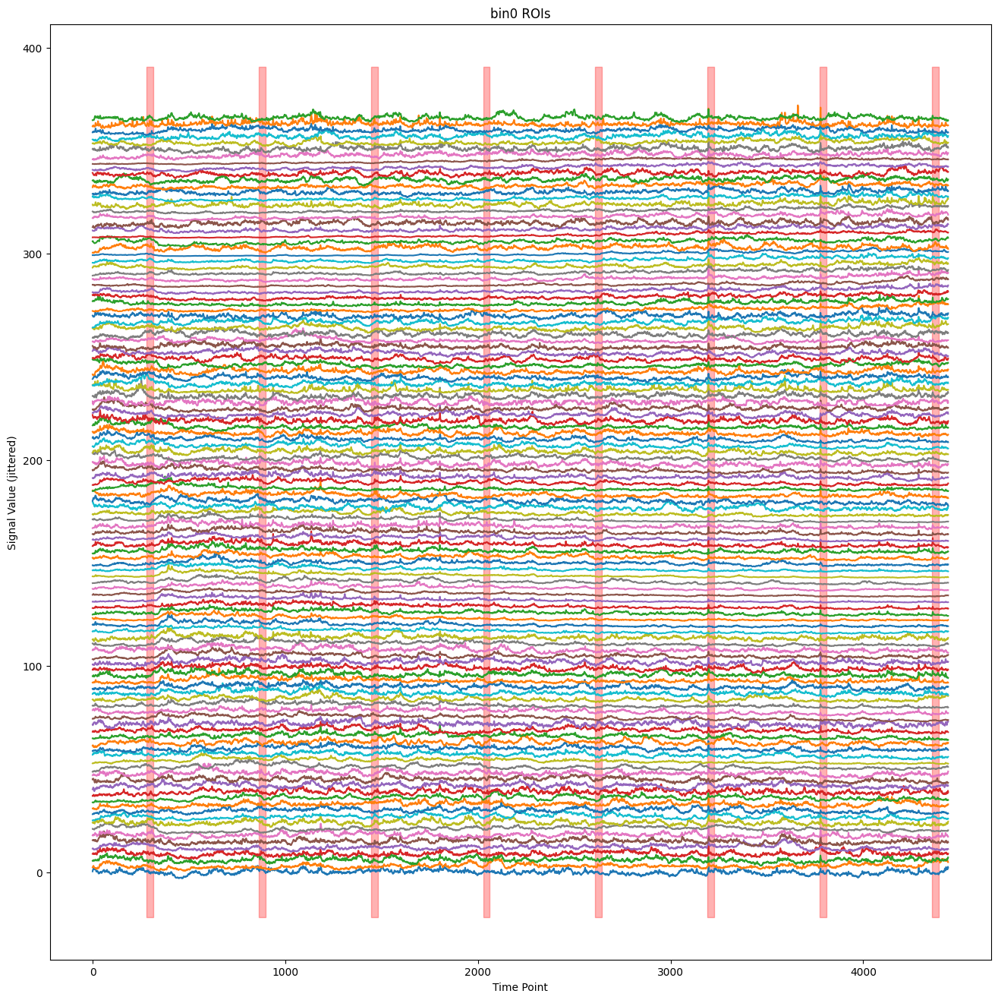

In [61]:
fig,ax = plt.subplots(figsize=(16, 16))
bin_index = 0
# Plot each signal with a jitter on the y-axis
y_offset = 3  # Adjust the offset value as needed
sn_binx = sn[mapped_embeddings == bin_index]
for i in range(len(sn_binx)):
    ax.plot(sn_binx[i,:] + (i * y_offset), label=f'Signal {i+1}')
ax.fill_between(behav_df.index, ax.get_ylim()[0], ax.get_ylim()[1], where=odor_mask, color='red', alpha=0.3)
    
# Add labels and title
plt.xlabel('Time Point')
plt.ylabel('Signal Value (jittered)')
plt.title('bin0 ROIs')

# Optionally, add a legend
#plt.legend()

# Show the plot
plt.show()

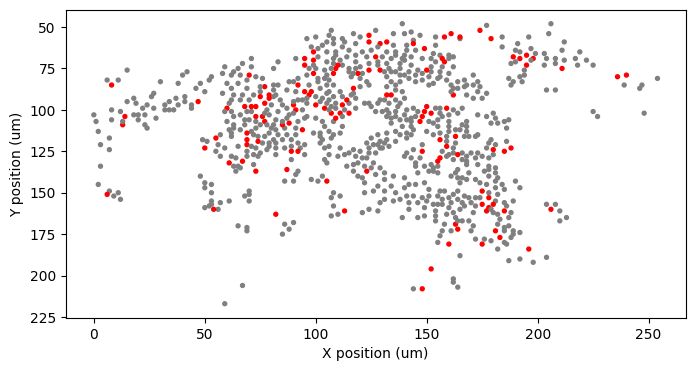

In [62]:
# Assuming cell_classes contains the class for each cell and class_of_interest is the one you want to highlight
def highlight_class(bin_index, mapped_embeddings):
    class_of_interest = bin_index  # Replace 'YourClassHere' with the actual class of interest
    highlight_color = 'red'  # Replace 'YourHighlightColorHere' with the color you want for the class of interest, e.g., 'red'

    # Create a color array, with gray for all cells not in the class of interest, and another color for those in the class
    colors = np.where(mapped_embeddings == class_of_interest, highlight_color, 'gray')

    # Now plot with the modified colors
    plt.figure(figsize=(8,4))
    plt.scatter(y_pos_cell, x_pos_cell, s=8, c=colors)  # Note: cmap here may not affect the colors since we're manually setting them
    plt.xlabel('X position (um)')
    plt.ylabel('Y position (um)')
    plt.gca().invert_yaxis()
    #plt.axis("square")
    plt.show()

highlight_class(bin_index, mapped_embeddings)

In [63]:
# plot around odor delivery
def find_odor_start_end(behav_df):
    odor_on = behav_df[behav_df.odor > 5].index
    odor_start = [odor_on[0]]
    odor_end = []
    for i in range(len(odor_on)-1):
        if odor_on[i+1] - odor_on[i]>5:
            odor_start.append(odor_on[i+1])
            odor_end.append(odor_on[i])
    if odor_on[-1] != len(behav_df)-1:
        odor_end.append(odor_on[-1])
    return odor_start[0:len(odor_end)], odor_end
odor_start, odor_end = find_odor_start_end(behav_df)


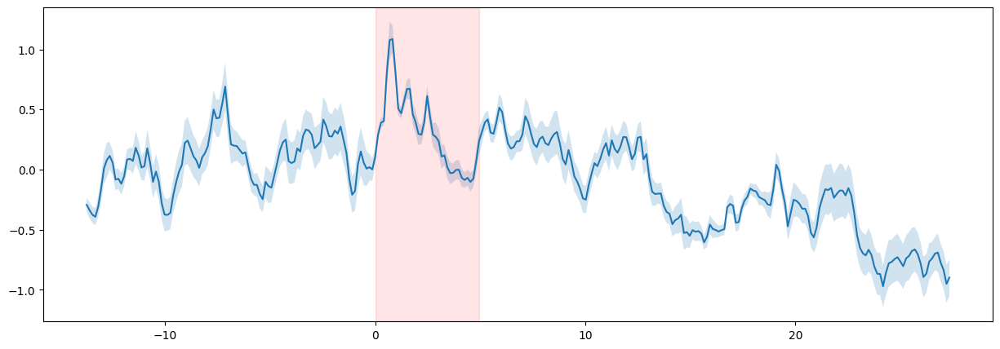

In [64]:
# start
fig_ex, ax = plt.subplots(figsize=[15,5])
odor_start, odor_end = find_odor_start_end(behav_df)
odor_all = []
for i in range(len(odor_start)-1):
    ind1 = odor_start[i]-100
    ind2 = odor_start[i]+200 
    odor_all.append(sn_binx[0,ind1:ind2])
    #ax.plot(behav_df.time[ind1:ind2]-behav_df.time[odor_start[i]], sn_binx[0,ind1:ind2],color='green',alpha = 0.5)
odor_mean = np.mean(np.array(odor_all),axis=0)
odor_std = np.std(np.array(odor_all),axis=0)/len(odor_all)
ax.plot(behav_df.time[ind1:ind2]-behav_df.time[odor_start[i]], odor_mean)
ax.fill_between(behav_df.time[ind1:ind2]-behav_df.time[odor_start[i]],odor_mean - odor_std, odor_mean + odor_std, alpha=0.2,)
ax.axvspan(0,behav_df.time[odor_end[0]]-behav_df.time[odor_start[0]], color='red',alpha=0.1)

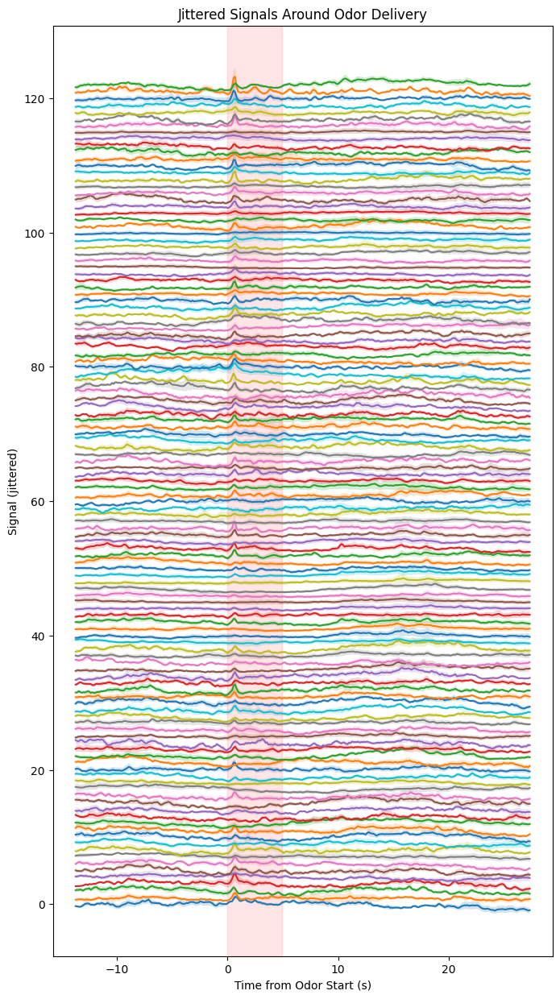

In [65]:
def plot_jittered_signals_around_odor(sn_binx, behav_df, y_jitter):
    """
    Plots all rows of sn_binx in a jittered manner on the y-axis around the odor delivery windows.

    Parameters:
    - sn_binx: 2D numpy array with dimensions (rows, time) representing signals to plot.
    - behav_df: DataFrame containing behavioral data, including time, odor_start, and odor_end.
    - y_jitter: float, the y-offset to apply between each row for clarity.
    """
    fig, ax = plt.subplots(figsize=[8,15])
    odor_start, odor_end = find_odor_start_end(behav_df)
    
    # Loop through each row in sn_binx
    for row_idx in range(sn_binx.shape[0]):
        odor_all = []
        for i in range(len(odor_start)-1):
            ind1 = odor_start[i] - 100
            ind2 = odor_start[i] + 200
            odor_all.append(sn_binx[row_idx, ind1:ind2])
        
        # Calculate mean and standard deviation for odor_all segments
        odor_mean = np.mean(np.array(odor_all), axis=0)
        odor_std = np.std(np.array(odor_all), axis=0) / np.sqrt(len(odor_all))  # Standard Error of the Mean (SEM)
        
        # Plot the mean signal for each row with y-offset
        ax.plot(behav_df.time[ind1:ind2] - behav_df.time[odor_start[i]], odor_mean + (row_idx * y_jitter), label=f'Row {row_idx}')
        
        # Optional: Add fill_between for SEM or STD
        ax.fill_between(behav_df.time[ind1:ind2] - behav_df.time[odor_start[i]],
                         odor_mean - odor_std + (row_idx * y_jitter),
                         odor_mean + odor_std + (row_idx * y_jitter), alpha=0.2)

    # Highlight the odor delivery window
    ax.axvspan(0, behav_df.time[odor_end[0]] - behav_df.time[odor_start[0]], color='red', alpha=0.1)
    
    plt.xlabel('Time from Odor Start (s)')
    plt.ylabel('Signal (jittered)')
    plt.title('Jittered Signals Around Odor Delivery')
    #plt.legend()
plot_jittered_signals_around_odor(sn_binx, behav_df, 1)

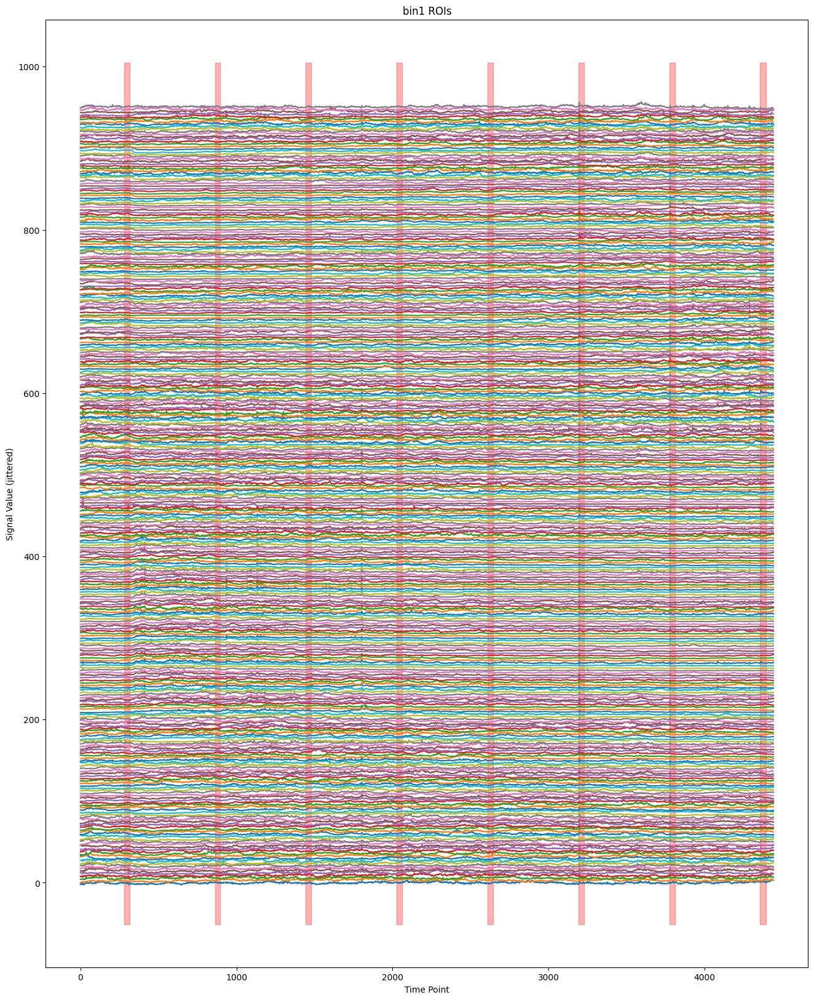

In [66]:
fig,ax = plt.subplots(figsize=(16, 20))
bin_index = 1
# Plot each signal with a jitter on the y-axis
y_offset = 3  # Adjust the offset value as needed
sn_binx = sn[mapped_embeddings == bin_index]
for i in range(len(sn_binx)):
    ax.plot(sn_binx[i,:] + (i * y_offset), label=f'Signal {i+1}')
ax.fill_between(behav_df.index, ax.get_ylim()[0], ax.get_ylim()[1], where=odor_mask, color='red', alpha=0.3)
    
# Add labels and title
plt.xlabel('Time Point')
plt.ylabel('Signal Value (jittered)')
plt.title('bin1 ROIs')

# Optionally, add a legend
#plt.legend()

# Show the plot
plt.show()

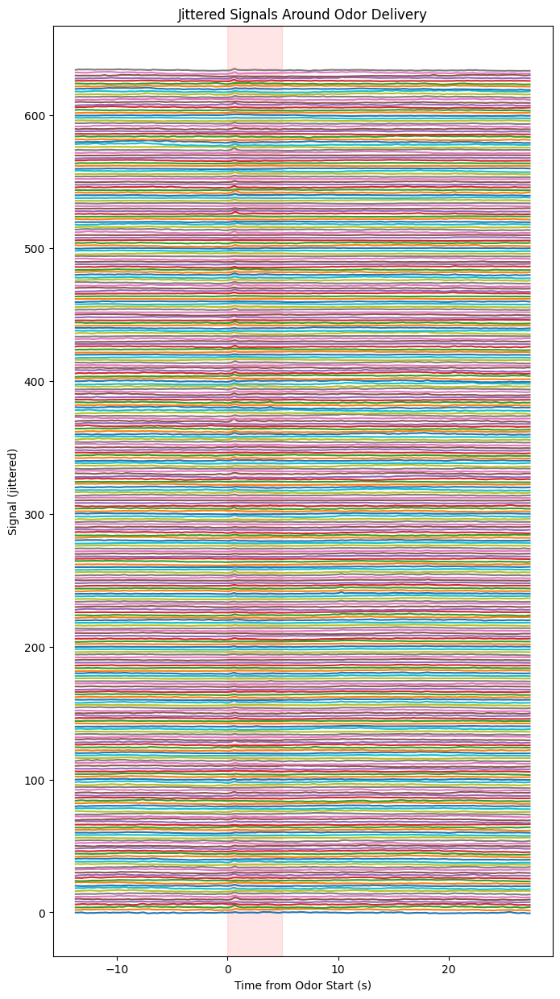

In [68]:
plot_jittered_signals_around_odor(sn_binx, behav_df, 2)

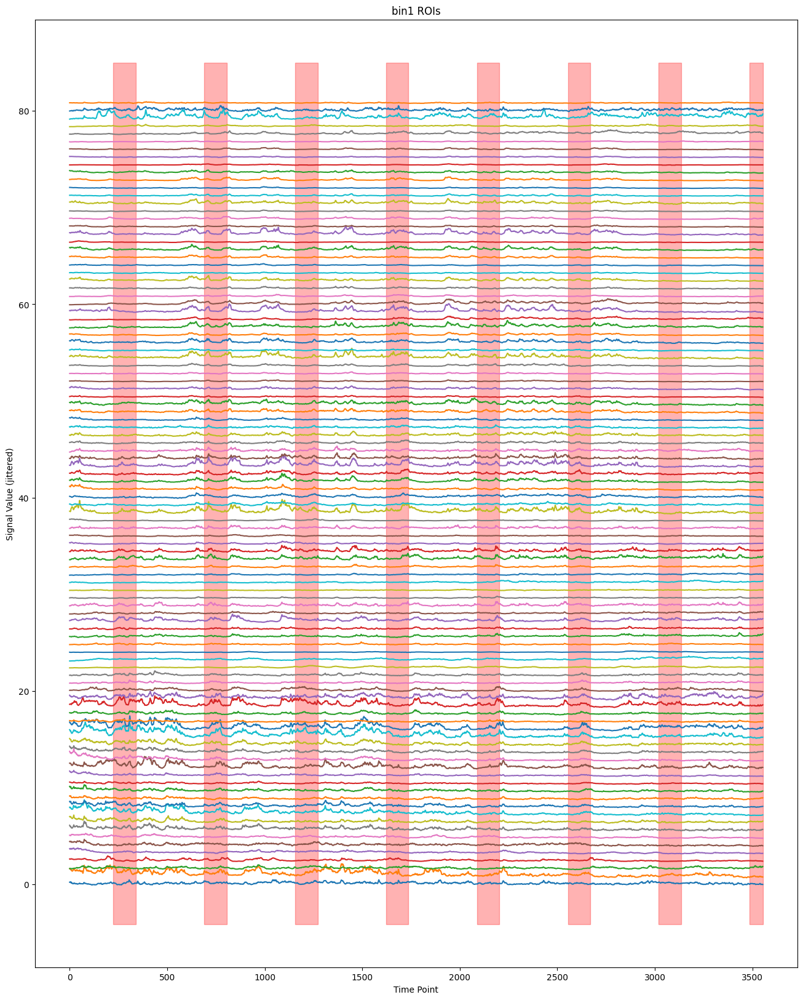

In [253]:
fig,ax = plt.subplots(figsize=(16, 20))
bin_index = 2
# Plot each signal with a jitter on the y-axis
y_offset = 0.8  # Adjust the offset value as needed
sn_binx = sn[mapped_embeddings == bin_index]
for i in range(len(sn_binx)):
    ax.plot(sn_binx[i,:] + (i * y_offset), label=f'Signal {i+1}')
ax.fill_between(behav_df.index, ax.get_ylim()[0], ax.get_ylim()[1], where=odor_mask, color='red', alpha=0.3)
    
# Add labels and title
plt.xlabel('Time Point')
plt.ylabel('Signal Value (jittered)')
plt.title('bin1 ROIs')

# Optionally, add a legend
#plt.legend()

# Show the plot
plt.show()